**Task 1.1 Define a problem.**

***Define an image classification problem that may help people better recycle, particularly by reducing contamination.***  

One possible image classification problem that may help people better recycle and reduce contamination is to classify different types of waste and identify the correct bin or disposal method for each item. The problem could involve training an image classification model to accurately identify common recyclables, such as paper, plastic, glass, and metal, as well as non-recyclable items, such as food waste, batteries, and electronic devices.

To reduce contamination, the model could be trained to identify items that should not be placed in the recycling bin, such as plastic bags, styrofoam, and contaminated food containers. By correctly identifying the appropriate disposal method for each item, the model could help reduce contamination and promote more effective recycling practices, ultimately contributing to a cleaner and more sustainable environment.  


***Describe the desired inputs and outputs, including the target classes.***  

The desired inputs for the image classification problem of identifying recyclable items and reducing contamination would be digital images of waste items taken from various angles and lighting conditions. These images would be in a standard format such as JPEG or PNG and would be preprocessed to ensure consistency in size, resolution, and color.

The desired output would be a classification label that identifies the type of waste item and the appropriate disposal method. The target classes could include common recyclable materials such as paper, plastic, glass, and metal, as well as non-recyclable items such as food waste, batteries, and electronic devices.

To reduce contamination, the model would also need to identify items that should not be placed in the recycling bin, such as plastic bags, styrofoam, and contaminated food containers. These items could be classified as "not recyclable" or "special disposal required" to indicate that they should be disposed of in a different way.

In summary, the desired input for the image classification problem would be digital images of waste items, and the desired output would be a classification label that identifies the type of waste item and the appropriate disposal method, including identifying items that should not be placed in the recycling bin to reduce contamination.

**Task 1.2 Make a plan**

***What dataset can you use to develop a deep learning solution?***  
To develop a deep learning solution for the image classification problem of identifying recyclable items and reducing contamination, we would need a dataset of images of waste items with corresponding labels indicating the appropriate disposal method.

There are several publicly available datasets that can be used for this purpose, including:

The TrashNet dataset: This dataset contains over 2,500 images of waste items, including plastic, paper, metal, and glass objects, as well as non-recyclable items such as food waste and Styrofoam. Each image is labeled with one of six categories, including cardboard, glass, metal, paper, plastic, and trash.

The Dastaset on the Classification of Trash for Recyclability: This dataset contains over 1,500 images of waste items, including paper, cardboard, plastic, glass, and metal objects. Each image is labeled with one of four categories, including non-recyclable, paper, plastic, and glass/metal.

The Waste Classification dataset: The Waste Classification dataset on Kaggle consists of images of different types of waste materials. The images are divided into two folders: one for organic waste and another for recyclable waste. There are a total of 22,500 images in the dataset.

These datasets can be used to train and evaluate deep learning models, such as convolutional neural networks (CNNs), to accurately classify waste items and identify the appropriate disposal method. Additionally, to improve the accuracy of the model, additional data can be collected by taking pictures of waste items in different environments and from different angles. 

***How many images do you need? How many for training? How many for testing?***  


**Task 1.3 Implement a solution**

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img

Found 22547 files belonging to 2 classes.
Using 18038 files for training.
Found 22547 files belonging to 2 classes.
Using 4509 files for validation.
Found 2505 files belonging to 2 classes.


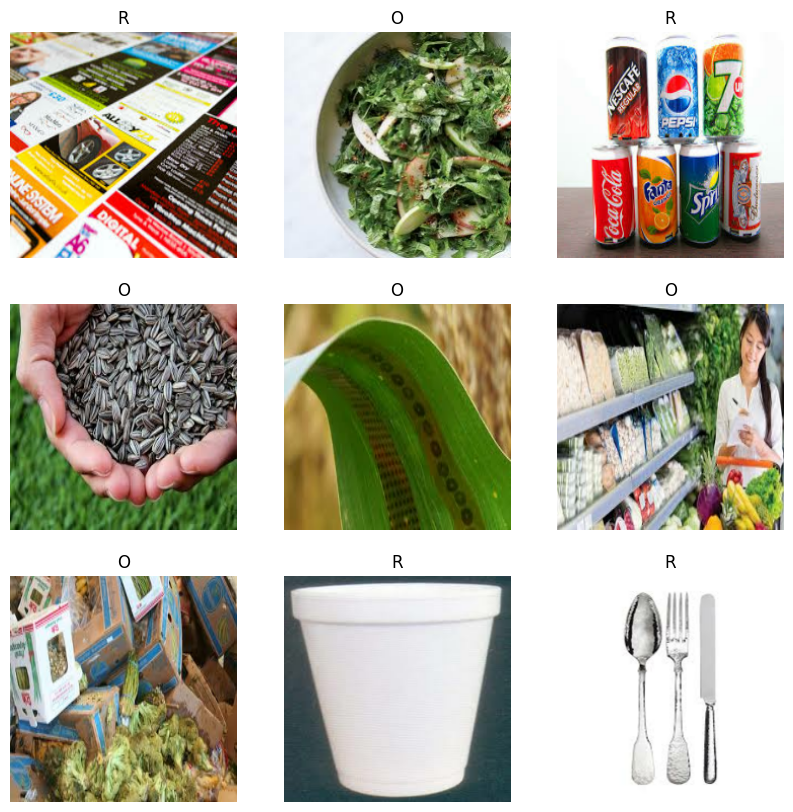

In [3]:
# Specify the paths to the train and test directories
train_path = '/content/gdrive/MyDrive/Colab Notebooks/DATASET/TRAIN'
test_path = '/content/gdrive/MyDrive/Colab Notebooks/DATASET/TEST'
IMAGE_SIZE = 224  # Specify the desired image size

train_ds = tf.keras.utils.image_dataset_from_directory(
  train_path,
  validation_split=0.2,
  class_names=None,
  subset="training",
  seed=123,
  image_size=(IMAGE_SIZE, IMAGE_SIZE),
  batch_size=32)

val_ds = tf.keras.utils.image_dataset_from_directory(
  train_path,
  validation_split=0.2,
  class_names=None,
  subset="validation",
  seed=123,
  image_size=(IMAGE_SIZE, IMAGE_SIZE),
  batch_size=32)

test_ds = tf.keras.utils.image_dataset_from_directory(
  test_path,
  subset=None,
  class_names=None,
  seed=123,
  image_size=(IMAGE_SIZE, IMAGE_SIZE),
  batch_size=32)

# Display images
import matplotlib.pyplot as plt

class_names = train_ds.class_names
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 111, 111, 32)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 52, 52, 128)      

100/100 [==============================] - 2s 24ms/step - loss: 0.4097 - accuracy: 0.8351 - val_loss: 0.3646 - val_accuracy: 0.8466


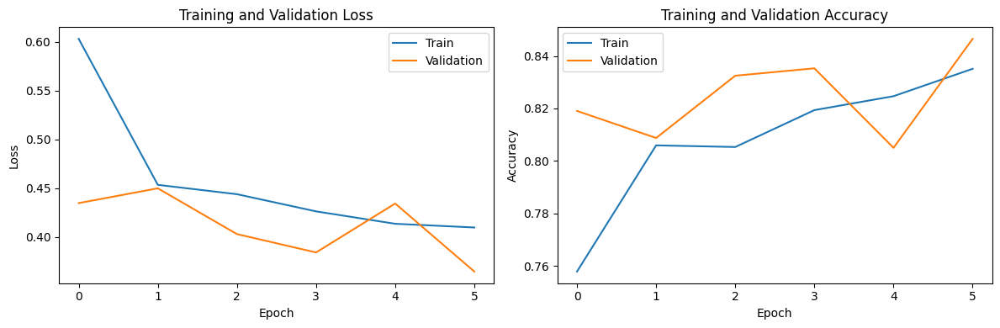

100/100 - 1s - loss: 0.3520 - accuracy: 0.8671 - 1s/epoch - 13ms/step
Test Loss: 0.3520
Test Accuracy: 0.8671


In [ ]:
# Define the model architecture

normalization_layer = layers.Rescaling(1./255)
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
normalized_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))
normalized_ds = test_ds.map(lambda x, y: (normalization_layer(x), y))

num_classes = 2
model = tf.keras.Sequential([
    layers.Rescaling(1./255, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# Train the model
history = model.fit(train_ds,
                    validation_data=val_ds,
                    epochs=10,
                    steps_per_epoch = 100,
                    validation_steps=100)

# Get the training history
train_loss = history.history['loss']
train_accuracy = history.history['accuracy']

# Get the validation history
val_loss = history.history['val_loss']
val_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(range(len(train_loss)), train_loss, label='Train')
plt.plot(range(len(val_loss)), val_loss, label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot the training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(len(train_accuracy)), train_accuracy, label='Train')
plt.plot(range(len(val_accuracy)), val_accuracy, label='Validation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()

# Evaluate the model on the test dataset
loss, accuracy = model.evaluate(test_ds, steps = 100, verbose=2)

# Print the model's performance
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

## **Task 2 (C Task) Analyse and improve the model**

### Task 2.1 Build an input pipeline for data augmentation


Build a data preprocessing pipeline to perform data augmentation. (You may use Keras ImageDataGenerator or write your own transformations.)

- Report the model performance with the pipeline added. How much performance gain have you achieved?    

- Profile your input pipeline to identify the most time-consuming operation. What actions have you taken to address that slow operation? (*Hint: You may use a profiler such as the [TensorFlow Profiler](https://github.com/tensorflow/profiler).*)

In [4]:
# Data augmentation using ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Load the training images and apply data augmentation
train_generator = datagen.flow_from_directory(
    train_path,
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=32,
    class_mode='binary')

# Load the validation images and apply rescaling only
val_generator = tf.keras.preprocessing.image_dataset_from_directory(
    train_path,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=32)

# Load the test images and apply rescaling only
test_generator = tf.keras.preprocessing.image_dataset_from_directory(
    test_path,
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=False)

# Define the model architecture
num_classes = 2
model1 = tf.keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model1.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model1.summary()

# Create a TensorFlow profiler callback
profiler_callback = tf.keras.callbacks.TensorBoard(
    log_dir='logs',
    histogram_freq=1,
    profile_batch='500,520')

# Train the model with augmented data
history = model1.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10,
    steps_per_epoch=100,
    validation_steps=100,
    callbacks=[profiler_callback])

# Evaluate the model on the test set
test_loss, test_accuracy = model1.evaluate(test_generator, verbose=2)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Save the model
model1.save('waste_classification_model.h5')

Found 22547 images belonging to 2 classes.
Found 22547 files belonging to 2 classes.
Using 4509 files for validation.
Found 2505 files belonging to 2 classes.
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           

To address the slow operation in the input pipeline, which is commonly caused by disk I/O and data loading, several actions have been taken in the code:

ImageDataGenerator: By using the ImageDataGenerator from Keras, the data augmentation is performed on-the-fly, which reduces the need to pre-process and store augmented images separately. This helps in improving the efficiency of data loading and reduces disk I/O operations.

Data Generator: Instead of loading all the training images into memory at once, the code uses a data generator (train_generator) to load and preprocess the images in batches. This allows for efficient memory usage and avoids potential memory overflow issues.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### Task 2.2 Compare the performance under equal training time

In [ ]:
print("Test Loss without Augmentation:", loss)
print("Test Accuracy without Augmentation:", accuracy)
print("Test Loss with Augmentation:", test_loss)
print("Test Accuracy with Augmentation:", test_accuracy)

Test Loss without Augmentation: 0.35195401310920715
Test Accuracy without Augmentation: 0.8670658469200134
Test Loss with Augmentation: 34.745845794677734
Test Accuracy with Augmentation: 0.7928143739700317


### Task 2.3 Identifying model strength and weakness

79/79 [==============================] - 1s 8ms/step
Class Index: 0, Class Name: O
Class Index: 1, Class Name: R


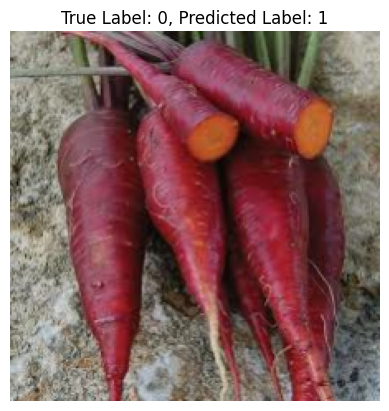

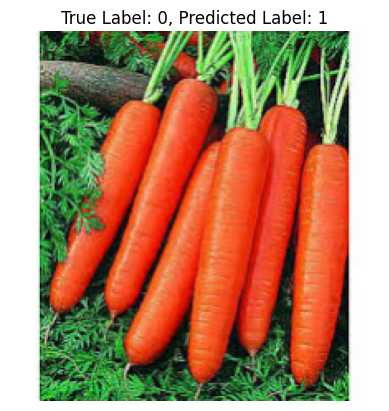

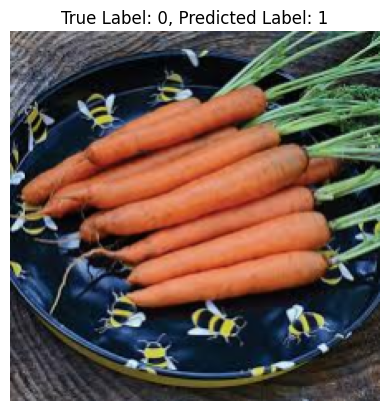

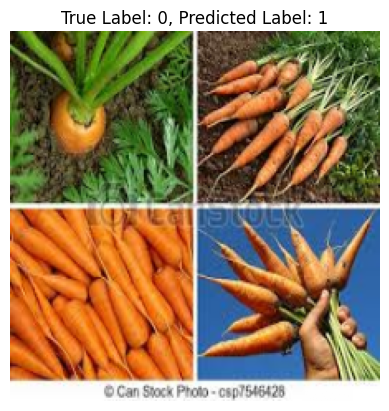

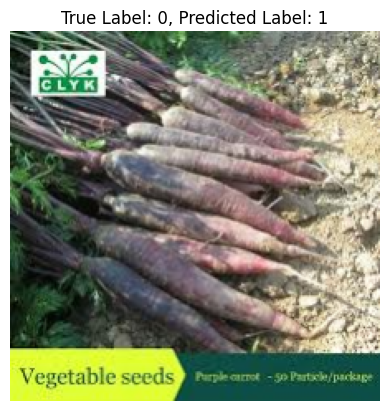

...

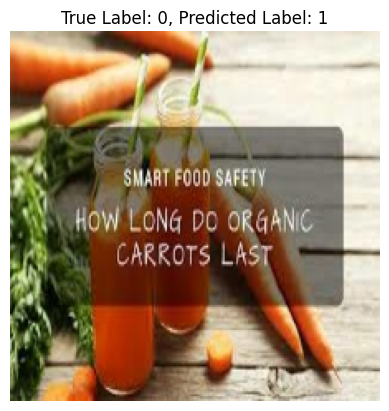

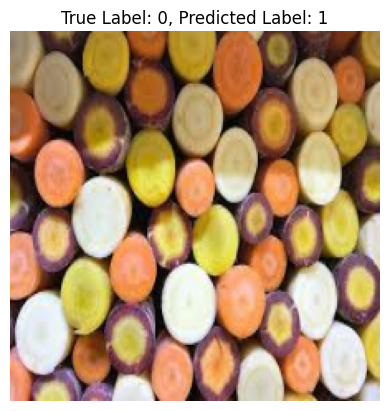

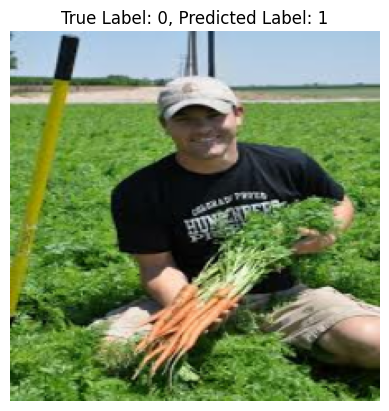

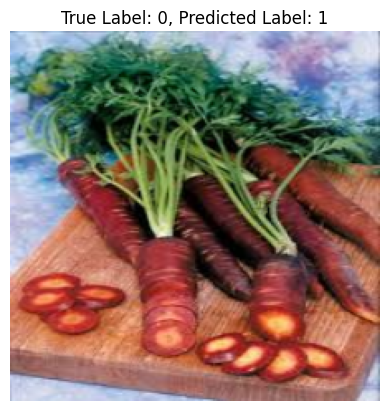

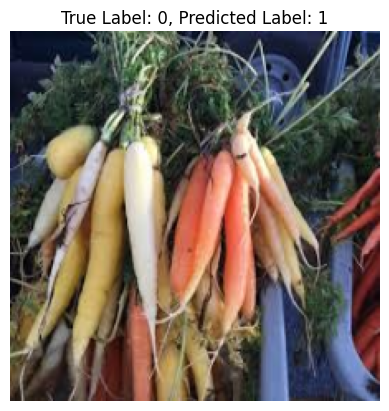

In [ ]:
# Convert the test generator to a NumPy array
test_images = []
test_labels = []

for images, labels in test_generator:
    test_images.extend(images)
    test_labels.extend(labels)

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Get the predicted labels for the test set
predictions = model1.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

# Find misclassified images
misclassified_indices = np.where(predicted_labels != test_labels)[0]
misclassified_images = test_images[misclassified_indices]

# Extract the class names from the test generator
class_names = test_generator.class_names

# Print the class indices along with class names
for i, class_name in enumerate(class_names):
    print(f"Class Index: {i}, Class Name: {class_name}")

# Analyze common characteristics of misclassified images
for i in range(5):
    image = misclassified_images[i]
    true_label = test_labels[misclassified_indices[i]]
    predicted_label = predicted_labels[misclassified_indices[i]]

    # Rescale pixel values to [0, 1]
    image = image / 255.0

    # Display the misclassified image
    plt.imshow(image)
    plt.title(f"True Label: {true_label}, Predicted Label: {predicted_label}")
    plt.axis('off')
    plt.show()


To improve the misclassification of both carrot and radish images, several steps can be taken. First, increasing the diversity of the training data by collecting more samples of carrots and radishes can help the model better learn their unique features. Additionally, fine-tuning the model architecture, adjusting hyperparameters, and experimenting with different data augmentation techniques specific to these classes can further improve the model's performance on carrot and radish classification.

In [8]:
new_test_path = '/content/gdrive/MyDrive/Colab Notebooks/Dataset_D'

# Load the test images and apply rescaling only
new_test_generator = tf.keras.preprocessing.image_dataset_from_directory(
    new_test_path,
    batch_size=32,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    shuffle=False)

# Load the saved model
loaded_model = tf.keras.models.load_model('waste_classification_model.h5')

# Evaluate the model on the new test set
new_test_loss, new_test_accuracy = loaded_model.evaluate(new_test_generator, verbose=2)

print("New Test Loss:", new_test_loss)
print("New Test Accuracy:", new_test_accuracy)


Found 199 files belonging to 2 classes.
7/7 - 7s - loss: 27.0100 - accuracy: 0.7588 - 7s/epoch - 1s/step
New Test Loss: 27.009986877441406
New Test Accuracy: 0.7587939500808716


Saving O (2).jpeg to O (2).jpeg
1/1 [==============================] - 0s 186ms/step


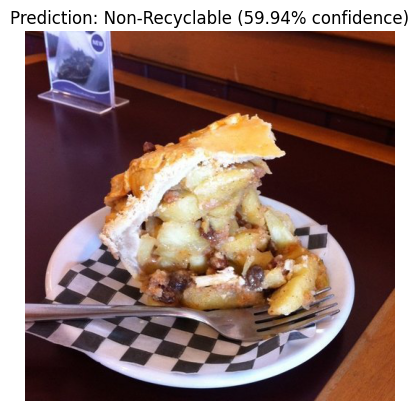

In [18]:
import tensorflow as tf
import numpy as np
from PIL import Image
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from google.colab import files

# Load the trained waste classification model
model = load_model('waste_classification_model.h5')

# Define the class labels
class_labels = ['Non-Recyclable', 'Recyclable']

# Function to preprocess the image
def preprocess_image(image):
    # Resize the image to the required size
    image = image.resize((IMAGE_SIZE, IMAGE_SIZE))
    # Convert the image to a numpy array
    image_array = np.array(image)
    # Normalize the image
    image_array = image_array / 255.0
    # Expand the dimensions to match the model input shape
    image_array = np.expand_dims(image_array, axis=0)
    return image_array

# Function to make a recycling recommendation
def make_recycling_recommendation(image):
    # Preprocess the image
    processed_image = preprocess_image(image)
    # Make predictions
    predictions = model.predict(processed_image)
    # Get the predicted class index
    class_index = np.argmax(predictions[0])
    # Get the predicted class label
    class_label = class_labels[class_index]
    # Get the confidence score for the predicted class
    confidence = predictions[0][class_index] * 100
    # Return the class label and confidence score
    return class_label, confidence

# Function to handle user image upload
def handle_image_upload(image_path):
    # Load the image
    image = Image.open(image_path)
    # Make a recycling recommendation
    class_label, confidence = make_recycling_recommendation(image)
    # Display the image and recommendation
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Prediction: {class_label} ({confidence:.2f}% confidence)")
    plt.show()

# Allow the user to upload an image
uploaded = files.upload()

# Get the uploaded image path
image_path = list(uploaded.keys())[0]

# Call the handle_image_upload function with the image path
handle_image_upload(image_path)